In [1]:
]activate ../../../../

  Activating project at `~/UCLOneDrive/SpatialStructureInMicrobialCommunities/SSMCCode`

In [2]:
using Revise
includet("./base.jl")

In [3]:
using GLMakie
using CairoMakie
CairoMakie.activate!()
using Statistics

# Rows where the two runs disagree

`data` - run_threads=10, solver_threads=nothing, 12 cpus, OpenBLAS left at its
default of 20 threads - against `data_st4_all` - solver_threads=4, 40 cpus, BLAS
pinned to 1 - over the same 60 rows of `systems.jld2`.

The rows here are the ones where the two ended on different retcodes, or more
than 2x apart in t, or one took over 1.5x the steps of the other; 6 of 60 by that
test. `reduce_weird.jl` picked them on dias and wrote `weird_rows.jld2`: the total
biomass field on a time axis thinned to 1200 points, plus each run's final state
and scalars. The full state series is ~14G over these 12 runs and stays there.

In [4]:
setup_df = load("systems.jld2", "pde_df")
smd = load("systems.jld2", "metadata")
Ns, Nr = get_Ns(setup_df.params[1])
T = setup_df.T[1]

wr = load("weird_rows.jld2", "runs")
weird = load("weird_rows.jld2", "weird")
whichruns = (:data, :st4)

at(k, i) = wr["$(k)_$(i)"]   # one run of one row

@printf("%d rows x %d runs, ntot sizes %s\n", length(weird), length(whichruns),
    string(unique([size(at(k, i).ntot) for k in whichruns, i in weird])))

6 rows x 2 runs, ntot sizes [(1200, 1000), (297, 1000), (87, 1000), (932, 1000)]

In [5]:
cmp = DataFrame(map(weird) do i
    a, b = at(:data, i), at(:st4, i)
    (; row=i, sys=a.gdf_row, p=a.p, L=a.L,
        data_rc=a.retcode, data_T=a.final_T, data_steps=a.num_saved * 10, data_h=a.realtime / 3600,
        st4_rc=b.retcode, st4_T=b.final_T, st4_steps=b.num_saved * 10, st4_h=b.realtime / 3600,
        T_ratio=b.final_T / a.final_T, step_ratio=b.num_saved / a.num_saved)
end)

Row,row,sys,p,L,data_rc,data_T,data_steps,data_h,st4_rc,st4_T,st4_steps,st4_h,T_ratio,step_ratio
,Int64,Int64,Float64,Float64,String,Float64,Int64,Float64,String,Float64,Int64,Float64,Float64,Float64
1,9,5,1.0,37.0636,MaxTime,8.2923e6,39740,10.0056,MaxTime,3.94013e6,30780,5.00546,0.475155,0.774534
2,15,8,1.0,41.1596,Success,1.0e8,2980,1.72391,Success,1.0e8,33050,4.99224,1.0,11.0906
3,18,9,0.1,39.5332,MaxTime,1.70797e7,52360,10.0052,Success,1.0e8,880,0.0829803,5.85489,0.0168067
4,21,11,1.0,39.5332,Success,1.0e8,13560,5.67594,MaxTime,1.4758e6,47000,5.00227,0.014758,3.46608
5,31,16,1.0,44.9769,Success,1.0e8,9330,3.72118,MaxTime,7.71187e6,39650,5.00249,0.0771187,4.24973
6,50,25,0.1,41.1596,MaxTime,9.75096e6,61710,10.0123,MaxTime,2.2544e7,60330,5.00308,2.31197,0.977637


Row,row,sys,p,L,data_rc,data_T,data_steps,data_h,st4_rc,st4_T,st4_steps,st4_h,T_ratio,step_ratio
,Int64,Int64,Float64,Float64,String,Float64,Int64,Float64,String,Float64,Int64,Float64,Float64,Float64
1,9,5,1.0,37.0636,MaxTime,8.2923e6,39740,10.0056,MaxTime,3.94013e6,30780,5.00546,0.475155,0.774534
2,15,8,1.0,41.1596,Success,1.0e8,2980,1.72391,Success,1.0e8,33050,4.99224,1.0,11.0906
3,18,9,0.1,39.5332,MaxTime,1.70797e7,52360,10.0052,Success,1.0e8,880,0.0829803,5.85489,0.0168067
4,21,11,1.0,39.5332,Success,1.0e8,13560,5.67594,MaxTime,1.4758e6,47000,5.00227,0.014758,3.46608
5,31,16,1.0,44.9769,Success,1.0e8,9330,3.72118,MaxTime,7.71187e6,39650,5.00249,0.0771187,4.24973
6,50,25,0.1,41.1596,MaxTime,9.75096e6,61710,10.0123,MaxTime,2.2544e7,60330,5.00308,2.31197,0.977637


## Space-time, total biomass

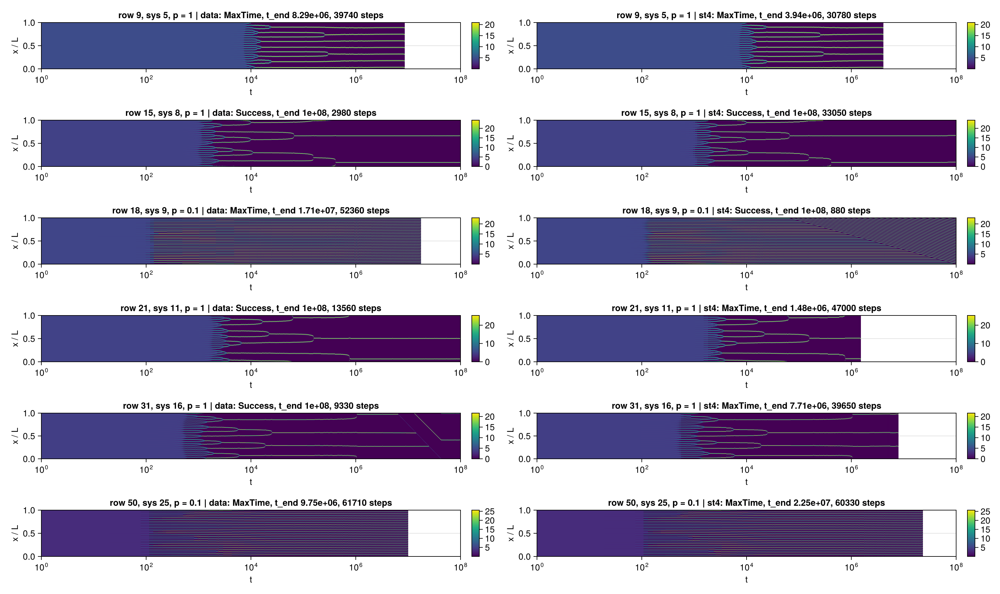

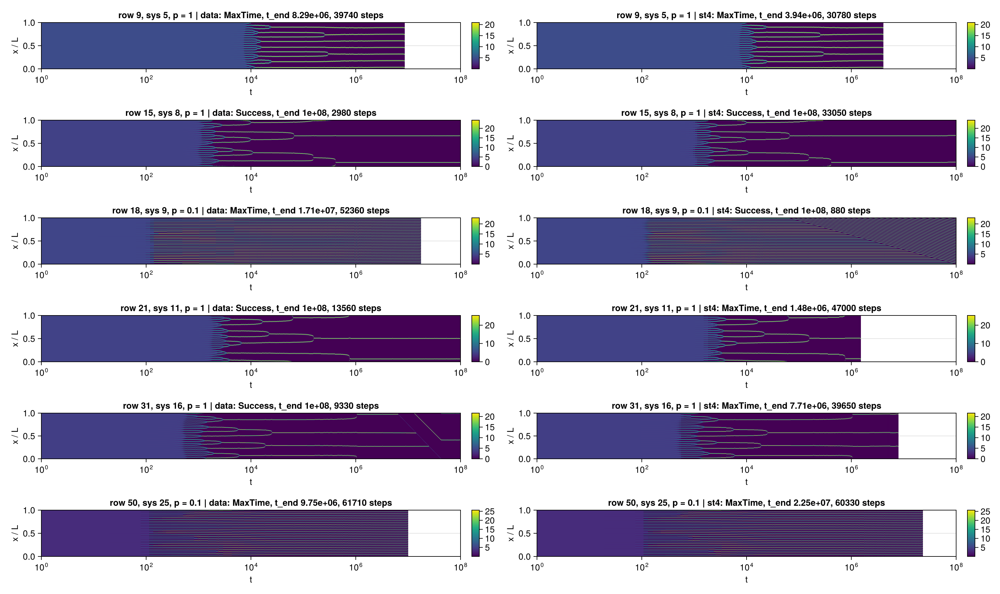

In [7]:

display(GLMakie.Screen(), fig)
xs_of(sN) = ((1:sN) .- 0.5) ./ sN
trange = (1e0, T)   # the solver saves a few states at t ~ 1e-17

"""
    log_edges(ts)

Cell edges for a heatmap on a log time axis. Makie extrapolates half a cell past
each end, which on these solver time grids lands at or below zero and makes log10
throw; bisecting in log space keeps every edge positive.
"""
function log_edges(ts)
    lt = log10.(ts)
    mid = (lt[1:end-1] .+ lt[2:end]) ./ 2
    10 .^ vcat(2 * lt[1] - mid[1], mid, 2 * lt[end] - mid[end])
end

fig = Figure(; size=(1250, 300 * length(weird)))

for (j, i) in enumerate(weird)
    for (kk, k) in enumerate(whichruns)
        a = at(k, i)
        ax = Axis(fig[j, 2kk-1]; xscale=log10, xlabel="t", ylabel="x / L",
            title=@sprintf("row %d, sys %d, p = %g | %s: %s, t_end %.3g, %d steps",
                i, a.gdf_row, a.p, string(k), a.retcode, a.final_T, a.num_saved * 10))
        idx = findall(t -> trange[1] <= t <= trange[2], a.ts)
        edges = log_edges(a.ts[idx])
        edges[1] = trange[1]           # before the first save it is still u0
        edges[end] = a.ts[idx[end]]    # a run that stopped early stops here
        hm = heatmap!(ax, edges, xs_of(a.sN), a.ntot[idx, :])
        xlims!(ax, trange)
        Colorbar(fig[j, 2kk], hm)
    end
end

display(GLMakie.Screen(), fig)

fig

## Final states

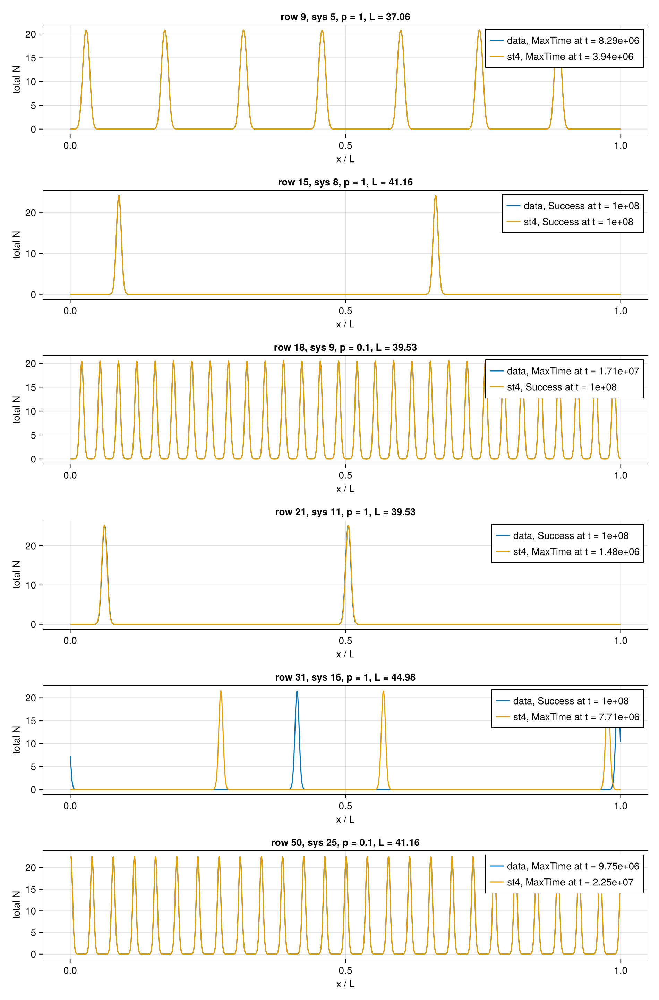

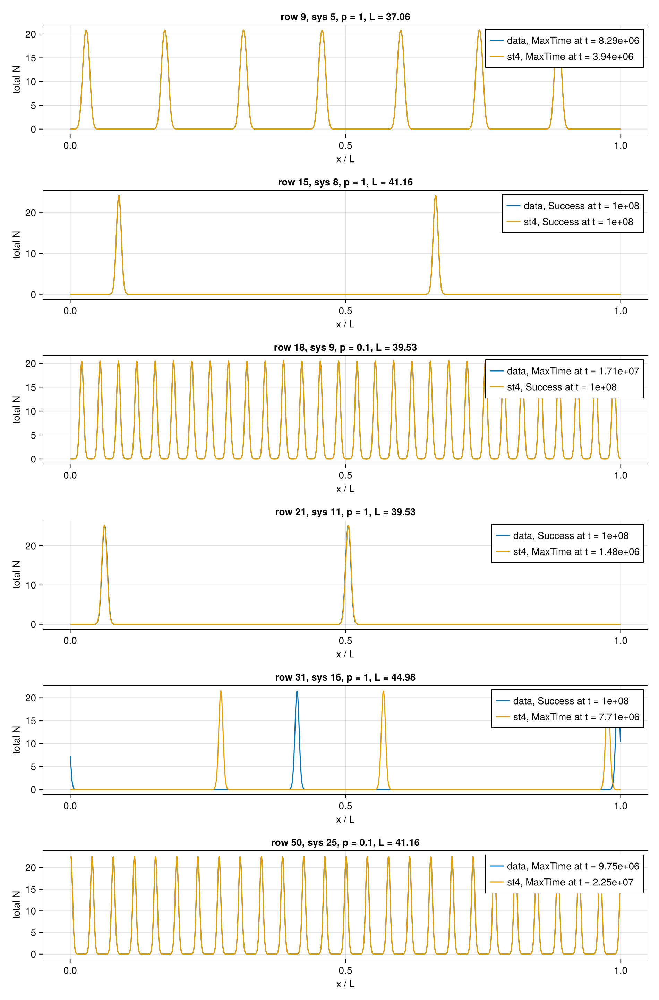

In [8]:
fig = Figure(; size=(950, 240 * length(weird)))

for (j, i) in enumerate(weird)
    a = at(:data, i)
    ax = Axis(fig[j, 1]; xlabel="x / L", ylabel="total N",
        title=@sprintf("row %d, sys %d, p = %g, L = %.4g", i, a.gdf_row, a.p, a.L))
    for k in whichruns
        b = at(k, i)
        lines!(ax, xs_of(b.sN), vec(sum(view(b.final_state, 1:Ns, :), dims=1));
            label=@sprintf("%s, %s at t = %.3g", string(k), b.retcode, b.final_T))
    end
    axislegend(ax; position=:rt)
end

fig

## Ecological diagrams

Set `drow`/`which` and rerun. `diagram_sfss_v3` takes one value per strain and
resource, so the final state is averaged over x.

row 18, data: MaxTime at t = 1.71e+07, maxresid 5.89e-11, 52360 steps

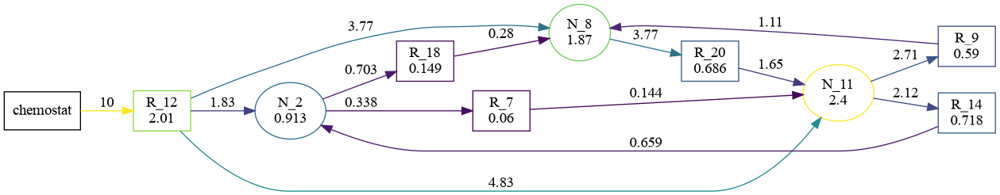

In [13]:
drow = 18          # any of weird
which = :data      # :data or :st4

a = at(which, drow)
ss = vec(mean(a.final_state, dims=2))

@printf("row %d, %s: %s at t = %.3g, maxresid %.3g, %d steps\n",
    drow, string(which), a.retcode, a.final_T, a.maxresid, a.num_saved * 10)

display(MIME("image/png"), diagram_sfss_v3(setup_df[drow, :].params, ss;
    strain_threshold=1e-3,
    edge_threshold=1e-3,
))